#### Dataset: Boston House Prices

#### Objective: Use hypothesis testing to give insights into the data

In [1]:
import pandas as pd
pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", None)
pd.set_option("display.float_format", "{:.4f}".format)
pd.set_option("display.max_info_rows", 200)

import numpy as np

In [2]:
from pandas_profiling import ProfileReport

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("white")
sns.set_context("paper", font_scale=1.8)
sns.set_palette("GnBu_r", 15)

#### Data Exploration:

What do we know about the dataset?
- First used in Hedonic Housing Prices and the Demand for Clean Air by David Harrison, Jr. and Daniel L.Rubinfield
- Period is 1970's, real estate boom
- Data point represent a census tract, an area of neighbourhood established by Boston Standard Metropolitan Statistical Area in 1970 for analysing populations
- Focused on the owner market; target feature MEDV is median value of owner-occupied homes in each census tract
- Structural features: RM, AGE
- Neighbourhood features: B, LSTAT, CRIM, ZN, INDUS, TAX, PTRATIO, CHAS
- Accessibility features: DIS, RAD
- Air pollution features: NOX

In [3]:
from sklearn.datasets import load_boston
boston = load_boston()

In [4]:
boston.keys()

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])

In [5]:
print(boston.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [6]:
# Combine features and target into a df
df = pd.DataFrame(data=boston.data, columns=boston.feature_names)
df['MEDV'] = boston.target
df.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(14)
memory usage: 55.5 KB


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: null_counts is deprecated. Use show_counts instead
  after removing the cwd from sys.path.


In [7]:
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.0063,18.0000,2.3100,0.0000,0.5380,6.5750,65.2000,4.0900,1.0000,296.0000,15.3000,396.9000,4.9800,24.0000
1,0.0273,0.0000,7.0700,0.0000,0.4690,6.4210,78.9000,4.9671,2.0000,242.0000,17.8000,396.9000,9.1400,21.6000
2,0.0273,0.0000,7.0700,0.0000,0.4690,7.1850,61.1000,4.9671,2.0000,242.0000,17.8000,392.8300,4.0300,34.7000
3,0.0324,0.0000,2.1800,0.0000,0.4580,6.9980,45.8000,6.0622,3.0000,222.0000,18.7000,394.6300,2.9400,33.4000
4,0.0691,0.0000,2.1800,0.0000,0.4580,7.1470,54.2000,6.0622,3.0000,222.0000,18.7000,396.9000,5.3300,36.2000


In [8]:
df.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.0000,506.0000,506.0000,506.0000,506.0000,506.0000,506.0000,506.0000,506.0000,506.0000,506.0000,506.0000,506.0000,506.0000
mean,3.6135,11.3636,11.1368,0.0692,0.5547,6.2846,68.5749,3.7950,9.5494,408.2372,18.4555,356.6740,12.6531,22.5328
std,8.6015,23.3225,6.8604,0.2540,0.1159,0.7026,28.1489,2.1057,8.7073,168.5371,2.1649,91.2949,7.1411,9.1971
min,0.0063,0.0000,0.4600,0.0000,0.3850,3.5610,2.9000,1.1296,1.0000,187.0000,12.6000,0.3200,1.7300,5.0000
25%,0.0820,0.0000,5.1900,0.0000,0.4490,5.8855,45.0250,2.1002,4.0000,279.0000,17.4000,375.3775,6.9500,17.0250
50%,0.2565,0.0000,9.6900,0.0000,0.5380,6.2085,77.5000,3.2074,5.0000,330.0000,19.0500,391.4400,11.3600,21.2000
75%,3.6771,12.5000,18.1000,0.0000,0.6240,6.6235,94.0750,5.1884,24.0000,666.0000,20.2000,396.2250,16.9550,25.0000
max,88.9762,100.0000,27.7400,1.0000,0.8710,8.7800,100.0000,12.1265,24.0000,711.0000,22.0000,396.9000,37.9700,50.0000


In [9]:
report = ProfileReport(df, title="Boston House Prices in 1970s", sort = None)
report

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

- There are no null values.
- The features have different scales.  
- Just by looking at the quartiles, min and max, we can tell that outliers are present in the dataset. MEDV, ZN, RM, CRIM and B seem to have outliers.
- CHAS is a categorical feature. RAD is a discrete feature (or a ordinal transformed into discrete). The rest is continuous.
- ZN has 372 zeros which means there were no residential-zoned lots over 25K sqft in these tracts.
- 35 tracts are in the boundary of Charles River.
- 16 tracts had maximum annual average nitrogen oxide exposure of 0.871 pphm.
- 43 tracts had houses that are all built prior to 1940.
- Most houses/tracts have 6 rooms.
- 5 tracts had the highest property tax rate of 7.11%.
- Interactions:
    - RM has the strongest positive correlation with MEDV.  More rooms means more spacious house, therefore higher median house price.
    - LSTAT and PTRATIO have a strong negative correlation with MEDV. This means that neighbourhood dominated by lower class is priced lower.  While higher pupil-teacher ratio implies each pupil get less attention therefore lower quality of education.
    - ZN, B, DIS and CHAS have weak positive correlation with MEDV. While INDUS, TAX, NOX, CRIM, RAD, AGE have weak negative correlation with MEDV.
    - There is multicollinearity between INDUS, TAX, NOX and RAD. It is also present between ZN, DIS, NOX, AGE and INDUS and between RM and LSTAT. 
        - Better access to radial highways (RAD) means more non-retail or industrial businesses (INDUS) therefore air is more polluted (NOX) and tax is higher (TAX).
        - More residential-zoned (ZN) lands means less non-retail or industrial businesses (INDUS) and less air-polluted (NOX). This also means more newer houses (AGE). More residentail the tract is, the farther to the business center (DIS).
        - Less rooms or space (RM) in low income neighbourhood is expected (LSTAT).

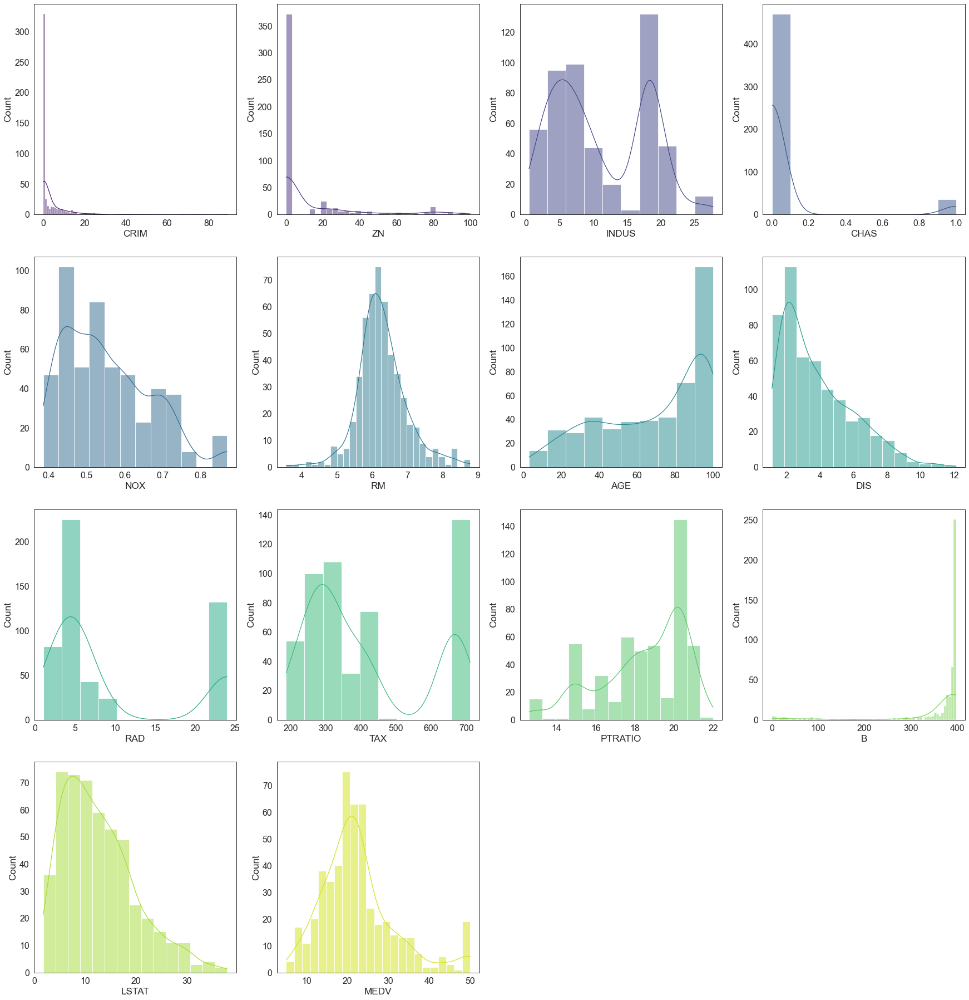

In [10]:
fig = plt.figure(figsize=(30, 8*4))
color_palette = sns.color_palette("viridis", len(df.columns))
for i, col in enumerate(df.columns):
    ax = fig.add_subplot(4, 4, i + 1)
    sns.histplot(df[col], kde=True, color=color_palette[i])
plt.show()

MEDV and RM seem normally distributed.

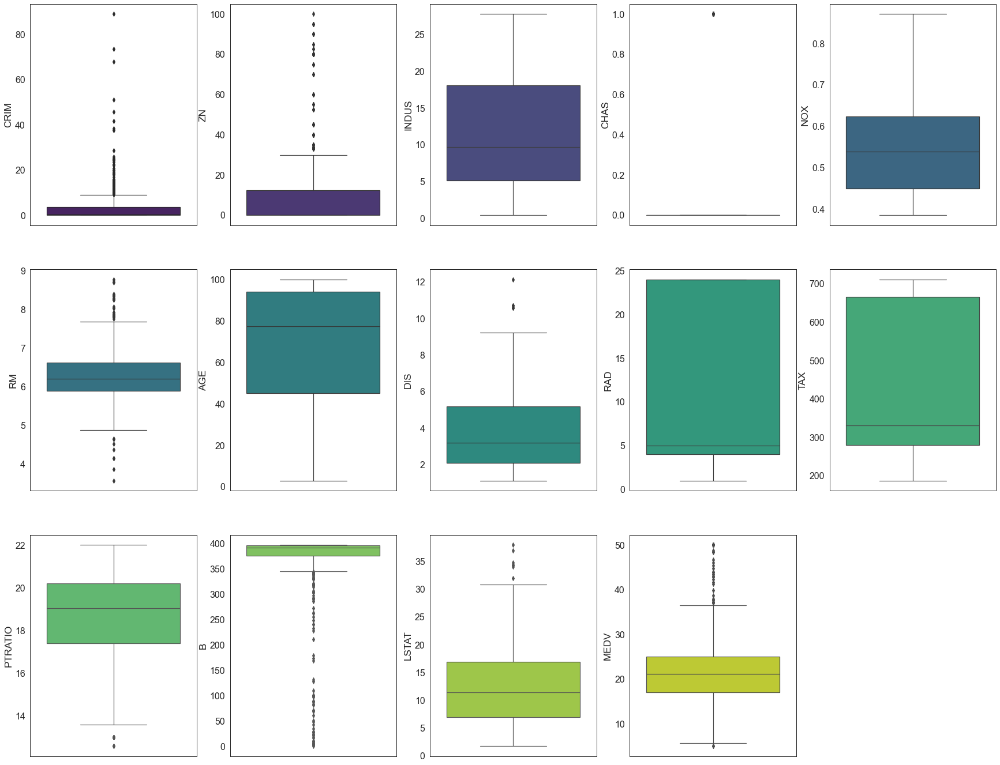

In [11]:
fig = plt.figure(figsize=(30, 8*3))
color_palette = sns.color_palette("viridis", len(df.columns))
for i, col in enumerate(df.columns):
    ax = fig.add_subplot(3, 5, i + 1)
    sns.boxplot(y=df[col], color=color_palette[i])
    plt.ylabel(col)

MEDV, ZN, RM, CRIM and B seem to have outliers.

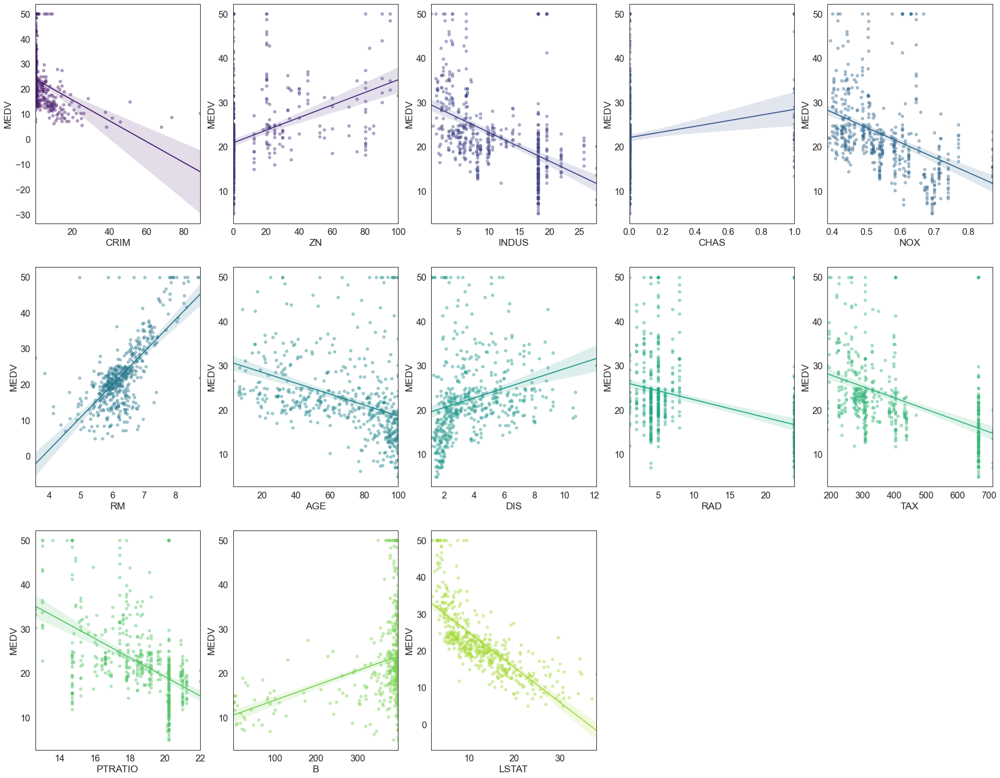

In [12]:
fig = plt.figure(figsize=(30, 8*3))
color_palette = sns.color_palette("viridis", len(df.columns))
for i, col in enumerate(df.columns):
    if col != 'MEDV':
        ax = fig.add_subplot(3, 5, i+1)
        sns.regplot(x=df[col], y=df['MEDV'], color=color_palette[i], scatter_kws={'alpha':0.4})
        plt.xlabel(col)
        plt.ylabel('MEDV')

Based on the above, LSTAT, RM, NOX, PTRATIO seem to have linear relationship with MEDV

Looking the graphs of B, RM, LSTAT, CRIM, data points with MEDV of 50 seems to be outliers. 50 could be used as a placeholder for the undisclosed or MEDV was capped at this amount. This could also be just plain error.

Now, let's look at feature B.  B has a weak positive correlation with MEDV. B and Bk (proportion of African American in each tract) have parabolic relationship. The below graph tells us only when Bk is more than 0.6 it may have positive effect on the price. It was mentioned in the paper that market discrimination means that house prices are higher at higher B.

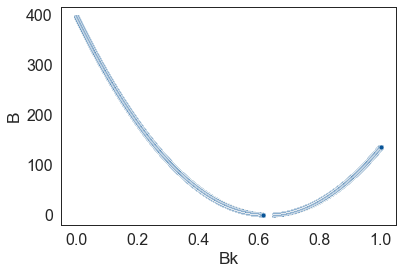

In [13]:
# B = 1000(Bk - 0.63)^2
x = list(np.arange(0, 1.0001, step=0.0001))
y = [1000*(i-0.63)**2 for i in x]
xy = [(a, b) for a, b in zip(x,y) if b>=df.B.min() and b<=df.B.max()]
sns.scatterplot(x=[c[0] for c in xy], y=[c[1] for c in xy]);
plt.xlabel('Bk')
plt.ylabel('B');

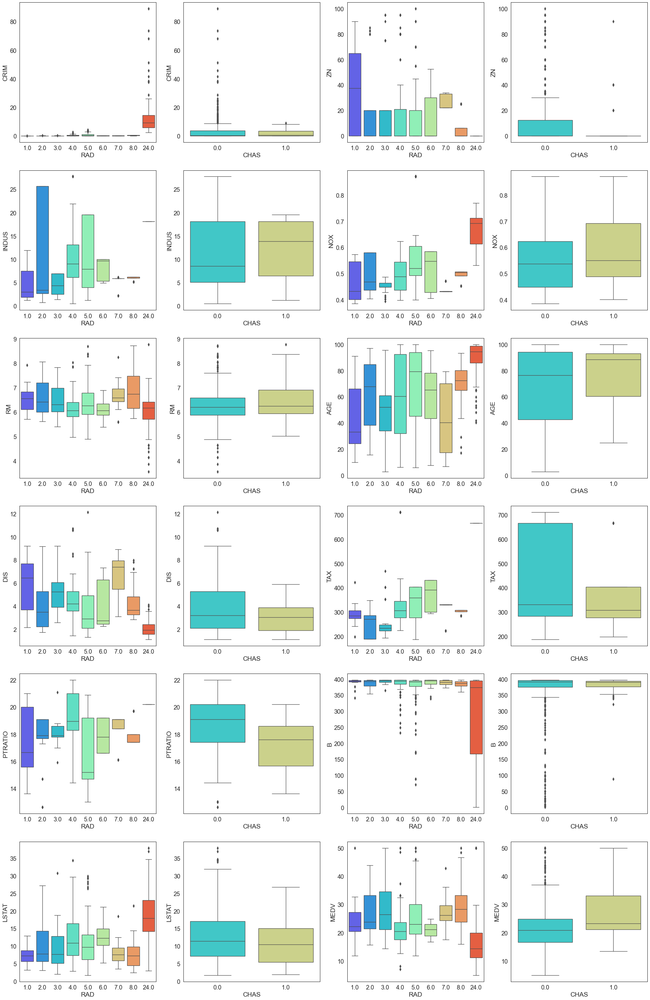

In [14]:
fig = plt.figure(figsize=(30, 8*6))
for i, col in enumerate(df.drop(columns=['RAD', 'CHAS']).columns):
    if col not in ['RAD', 'CHAS']:
        ax = fig.add_subplot(6, 4, ((i+1)*2)-1)
        sns.boxplot(x='RAD', y=col, data=df, palette="rainbow")
        ax = fig.add_subplot(6, 4, ((i+1)*2))
        sns.boxplot(x='CHAS', y=col, data=df, palette="rainbow")
plt.show()

<!-- Instead of manually eliminate the outliers, we will do it systematically using z-score: -->

Tracts with RAD=24 seem to have very different MEDV, LSTAT, RAD, DIS, AGE and CRIM based on the boxplots above.  

In [15]:
# from scipy import stats

In [16]:
# # Normalised the numerical features
# df_norm = df.drop(columns=['CHAS']).applymap(lambda x: np.log(x+.0001)) # added 0.0001 for x=0

# # Keep rows with abs(z-core) < 3
# # df2 = df.iloc[df_norm[(np.abs(stats.zscore(df_norm)) < 3).all(axis = 1)].index, :]
# df2 = df[df.RAD!=24]
# df2.head()

In [38]:
# from sklearn.preprocessing import StandardScaler

In [39]:
# scaler = StandardScaler()
# standardised = scaler.fit_transform(df.drop(columns=['CHAS', 'RAD']))
# df_scaled = pd.DataFrame(standardised, columns=df.drop(columns=['CHAS', 'RAD']).columns)
# df_scaled['CHAS'] = df['CHAS']
# df_scaled['RAD'] = df['RAD']
# display(df_scaled.head())
# df_scaled.shape

Let's create a new dataframe without RAD==24:

In [17]:
df2 = df[df.RAD!=24]
display(df2.head())
df2.shape

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.0063,18.0000,2.3100,0.0000,0.5380,6.5750,65.2000,4.0900,1.0000,296.0000,15.3000,396.9000,4.9800,24.0000
1,0.0273,0.0000,7.0700,0.0000,0.4690,6.4210,78.9000,4.9671,2.0000,242.0000,17.8000,396.9000,9.1400,21.6000
2,0.0273,0.0000,7.0700,0.0000,0.4690,7.1850,61.1000,4.9671,2.0000,242.0000,17.8000,392.8300,4.0300,34.7000
3,0.0324,0.0000,2.1800,0.0000,0.4580,6.9980,45.8000,6.0622,3.0000,222.0000,18.7000,394.6300,2.9400,33.4000
4,0.0691,0.0000,2.1800,0.0000,0.4580,7.1470,54.2000,6.0622,3.0000,222.0000,18.7000,396.9000,5.3300,36.2000


(374, 14)

In [41]:
df2.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,374.0000,374.0000,374.0000,374.0000,374.0000,374.0000,374.0000,374.0000,374.0000,374.0000,374.0000,374.0000,374.0000,374.0000
mean,0.3856,15.3743,8.6792,0.0722,0.5131,6.3773,61.0818,4.4070,4.4492,317.2620,17.8398,380.8805,10.5539,24.6960
std,0.6251,25.9731,6.3644,0.2592,0.1012,0.6739,28.3015,2.1047,1.6329,81.5188,2.2110,39.4986,5.9463,8.4216
min,0.0063,0.0000,0.4600,0.0000,0.3850,4.9030,2.9000,1.3216,1.0000,187.0000,12.6000,70.8000,1.7300,7.0000
25%,0.0605,0.0000,4.0500,0.0000,0.4379,5.9272,36.2250,2.6541,4.0000,270.0000,16.4000,383.7425,6.1600,19.4000
50%,0.1321,0.0000,6.9100,0.0000,0.4930,6.2310,62.9000,4.0171,4.0000,305.0000,18.0000,392.7800,9.4400,22.6500
75%,0.3662,22.0000,10.5900,0.0000,0.5470,6.7240,88.4750,5.8355,5.0000,384.0000,19.2000,396.3225,13.4950,28.4000
max,4.0974,100.0000,27.7400,1.0000,0.8710,8.7250,100.0000,12.1265,8.0000,711.0000,22.0000,396.9000,34.4100,50.0000


Let's visualise df2:

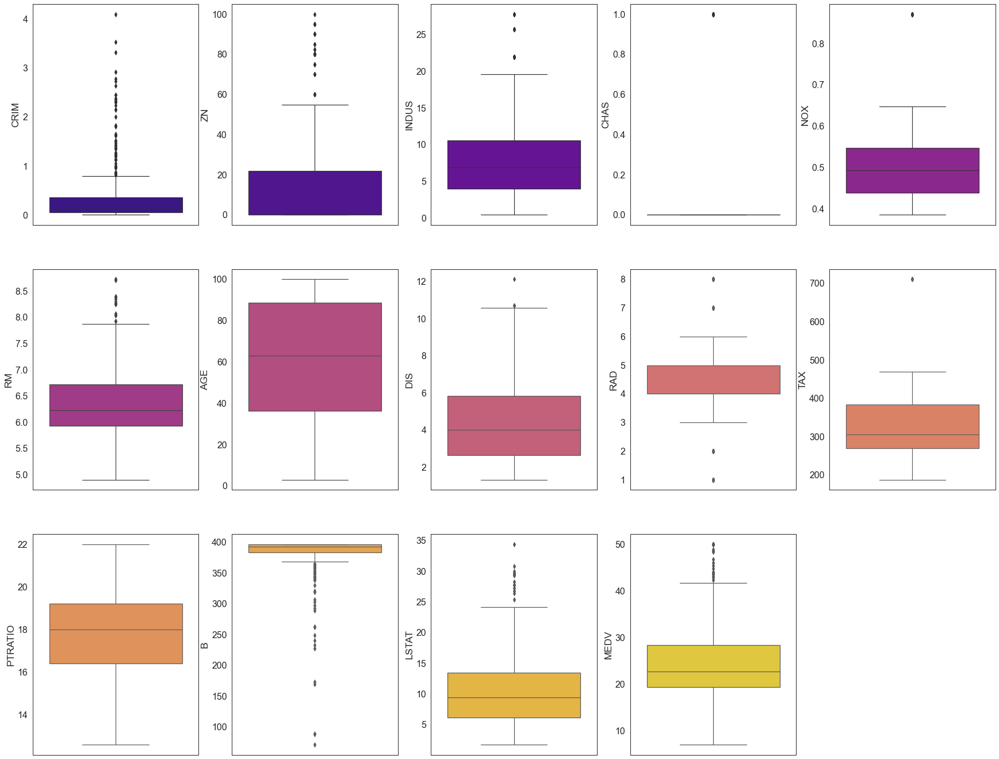

In [43]:
fig = plt.figure(figsize=(30, 8*3))
color_palette = sns.color_palette("plasma", len(df2.columns))
for i, col in enumerate(df2.columns):
    ax = fig.add_subplot(3, 5, i + 1)
    sns.boxplot(y=df2[col], color=color_palette[i])
    plt.ylabel(col)

We can still see data points outside the whiskers even after removing RAD==24.

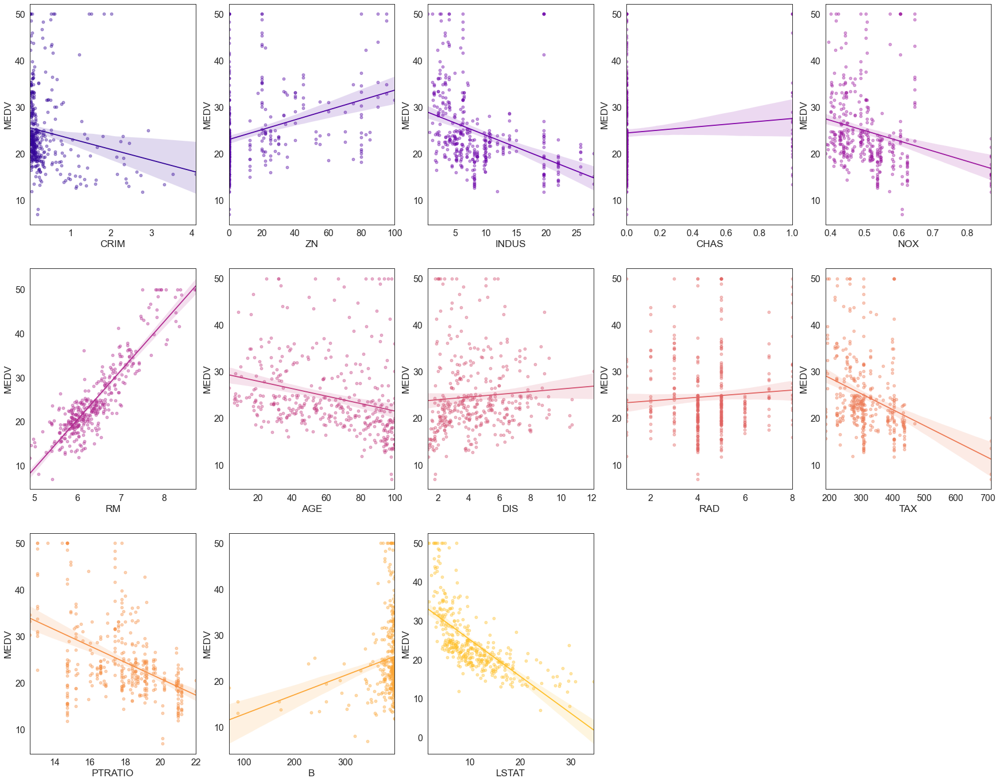

In [45]:
fig = plt.figure(figsize=(30, 8*3))
color_palette = sns.color_palette("plasma", len(df2.columns))
for i, col in enumerate(df2.columns):
    if col != 'MEDV':
        ax = fig.add_subplot(3, 5, i+1)
        sns.regplot(x=df2[col], y=df2['MEDV'], color=color_palette[i], scatter_kws={'alpha':0.4})
        plt.xlabel(col)
        plt.ylabel('MEDV')

- RM seems to have linear relationship with MEDV.  
- LSTAT could either have negative linear or exponential relationship with the target variable. 
- While INDUS, CRIM and NOX seem to have exponential relationship with the target variable.

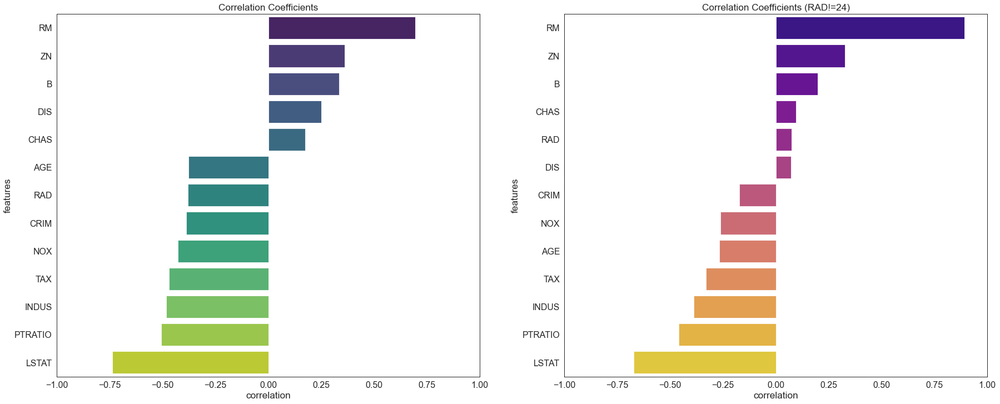

In [47]:
fig = plt.figure(figsize=(30, 12))

ax = fig.add_subplot(1, 2, 1)
corr_table = df.corr()[["MEDV"]].sort_values("MEDV", ascending=False).iloc[1:,:].reset_index()
sns.barplot(x="MEDV", y="index", data=corr_table, palette='viridis')
plt.xlabel("correlation")
plt.ylabel("features")
plt.xlim(((-1,1)))
plt.title("Correlation Coefficients")

ax = fig.add_subplot(1, 2, 2)
corr_table = df2.corr()[["MEDV"]].sort_values("MEDV", ascending=False).iloc[1:,:].reset_index()
sns.barplot(x="MEDV", y="index", data=corr_table, palette='plasma')
plt.xlabel("correlation")
plt.ylabel("features")
plt.xlim(((-1,1)))
plt.title("Correlation Coefficients (RAD!=24)")

plt.show()

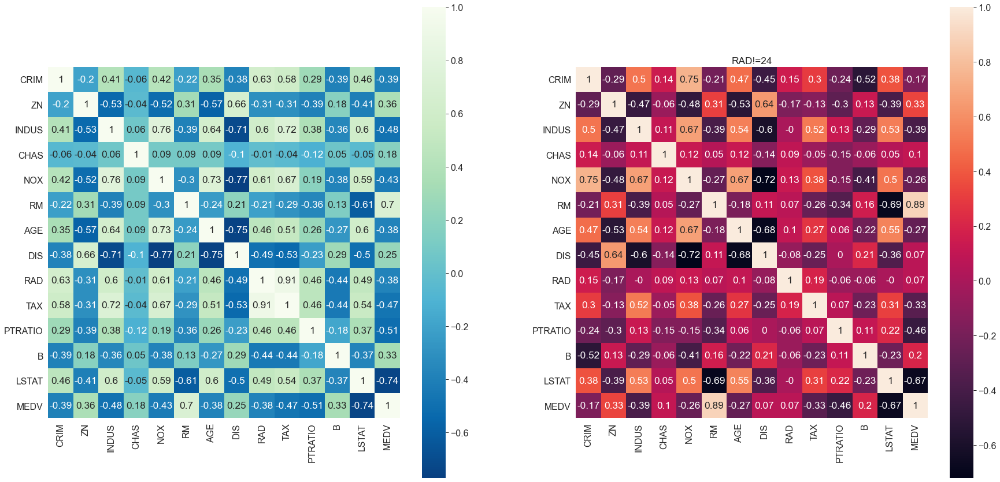

In [48]:
fig = plt.figure(figsize=(30, 15))

ax = fig.add_subplot(1, 2, 1)
sns.heatmap(data=df.corr().round(2), annot=True, square=True, cmap='GnBu_r')

ax = fig.add_subplot(1, 2, 2)
sns.heatmap(data=df2.corr().round(2), annot=True, square=True)
plt.title("RAD!=24")

plt.show()

After removing RAD==24:
- RM and LSTAT still have strong correlation with MEDV. 
- RAD now has weak positive correlation with MEDV (previously negative).
- Correlation coefficients of RM increased, while CRIM, CHAS, NOX, AGE, DIS, TAX, PTRATIO, B, LSTAT dropped.
- Multicollinearity is still present between the following:
    - RM, LSTAT: Less rooms or space in low income neighbourhood is expected.
    - CRIM, NOX, INDUS: More non-retail or industrial business leads to worse air pollution. Higher crime rate in less residential tracts.
    - ZN, DIS, AGE: More bigger residential lots mean farther to business centers. This also mean more high-income so newer house.
    - INDUS, NOX, DIS, AGE: More non-retail or industrial business leads to worse air pollution. More older houses could mean these are the few residences left in non-retail or industrial business-dominated tracts, which are closer to business centers.
    - TAX, INDUS: More non-retail or industrial business means higher tax rate.
    - B, CRIM: B and Bk have quadratic relationship

In [29]:
import statistics 
import scipy
import math
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats import weightstats

#### Hypothesis Testing:

**Does MEDV of RAD==24 lower than the MED of RAD!=24?**

From our EDA, RAD==24 seems to be outliers or very different from the other tracts. So if we are to build a prediction model should we exclude RAD==24? Let's see if we can provide evidence for this.

We will use 2-sample ztest for this since we are comparing 2 groups and samples > 30 (otherwise t-test).  We will assume:
- samples are independent
- sample is from a normally distributed population

We will set level of significance or alpha to 0.05.

H0: Mean MEDV of RAD==24 and RAD!=24 are equal

H1: Mean MEDV of RAD==24 and RAD!=24 are not equal

In [49]:
df.RAD.value_counts()

24.0000    132
5.0000     115
4.0000     110
3.0000      38
6.0000      26
2.0000      24
8.0000      24
1.0000      20
7.0000      17
Name: RAD, dtype: int64

In [50]:
ztest ,pval = weightstats.ztest(
    x1 = df[df.RAD==24].MEDV.sample(100, random_state=42).tolist(), 
    x2 = df[df.RAD!=24].MEDV.sample(100, random_state=42).tolist(), 
    value=0,
    alternative='two-sided')
ztest ,pval

(-6.575403640133968, 4.852135834878323e-11)

We reject the null as our p-value is less than alpha (0.05). This means that the mean MEDV of each group statistically different. 

**Do MEDV of each RAD index (ex 24) differ from each other?**

We will use one-way ANOVA as we are to compare more than two groups at the same time.  We will get samples from each RAD index.  We will assume:
- samples are independent
- sample is from a normally distributed population
- population standard deviations of the groups are all equal

We will set level of significance or alpha to 0.05.

H0: Mean MEDV of RAD 1-8 are equal

H1: Mean MEDV of RAD 1-8 are not equal

In [51]:
df2.RAD.value_counts()

5.0000    115
4.0000    110
3.0000     38
6.0000     26
2.0000     24
8.0000     24
1.0000     20
7.0000     17
Name: RAD, dtype: int64

In [52]:
anova = scipy.stats.f_oneway(
    df2[df2.RAD==1].MEDV.sample(10, random_state=42).tolist(), 
    df2[df2.RAD==2].MEDV.sample(10, random_state=42).tolist(), 
    df2[df2.RAD==3].MEDV.sample(10, random_state=42).tolist(), 
    df2[df2.RAD==4].MEDV.sample(10, random_state=42).tolist(), 
    df2[df2.RAD==5].MEDV.sample(10, random_state=42).tolist(), 
    df2[df2.RAD==6].MEDV.sample(10, random_state=42).tolist(), 
    df2[df2.RAD==7].MEDV.sample(15, random_state=42).tolist(), 
    df2[df2.RAD==8].MEDV.sample(15, random_state=42).tolist(), 
)
anova

F_onewayResult(statistic=2.713548424437167, pvalue=0.012290847997392494)

We reject the null as our p-value is less than alpha (0.05). This means that the mean MEDV of each RAD are statistically different from each other. 

**Do MEDV of CHAS==1 and CHAS==0 differ?**

We are interested to know if the proximity to Charles River affects the MEDV.  We will exclude RAD==24 from this test.

We will use 2-sample t-test since we cannot get samples > 30. We will assume:
- samples are independent
- sample is from a normally distributed population
- population standard deviations of the groups are all equal

We will again set alpha to 0.05.

H0: Mean MEDV of CHAS==1 and CHAS==0 are equal

H1: Mean MEDV of CHAS==1 and CHAS==0 are not equal

In [53]:
df2.CHAS.value_counts()

0.0000    347
1.0000     27
Name: CHAS, dtype: int64

In [54]:
ttest ,pval = scipy.stats.ttest_ind(
    a = df2[df2.CHAS==1].MEDV.sample(15, random_state=42).tolist(), 
    b = df2[df2.CHAS==0].MEDV.sample(15, random_state=42).tolist(), 
)
ttest ,pval

(0.3484844228494078, 0.7300831216366463)

We fail to reject the null as our p-value is greater than alpha (0.05). There is no statistical evidence to prove that mean MEDV of the 2 groups are not equal.